In [3]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
from vst_function import *
from stattools.resampling import PermutationTest
from scipy import stats
from pyranges import PyRanges
import seaborn as sns

In [4]:
## Read and merge files 
anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1')

ids_hg19 = pd.DataFrame()
ids_hg19['Sample'] = anotation['3-Illumina_ID']
ids_hg19['Region'] = anotation['10-Region']


In [5]:
def read_file(file):
    """
    Read a file to a dict of lists.

    :param str file: Path to a sample file.
    :return: dict of lists of records
    :rtype: dict
    """
    vcf_dict = []
    #df = pd.DataFrame()
    with open(file, 'r') as invcf:
        for line in invcf:
            if line.startswith('track'):
                continue
                
    
    
            line = line.strip().split()
            CHR = line[0]
            START = line[1]
            END = line[2]
            SCORE = line[3]
            name = str(file.split('/')[-1]) 
            
            if SCORE == '2':
                continue
            
            vcf_dict.append([name, CHR, START,END, SCORE])
            
            
    return vcf_dict



def read_multiple_files(path_of_files):
    """
    Read the path of vcf files to a dataframe.
    :param str file: Path to a files.
    :return: dict of lists of  records
    :rtype: dict
    """
    files = glob.glob(path_of_files+'*')
    chm13list = []
    for file in files:
        #return pd.DataFrame(read_vcf(file))
        chm13list.append(read_file(file))
    
    return (chm13list)


df = read_multiple_files('../data/CHM13_SGDP/')


In [6]:
Output = []
  
# Using iteration
for temp in df:
    for elem in temp:
        Output.append(elem)


In [7]:
chm13 = pd.DataFrame(Output)

chm13.columns = ['Sample', 'Chromosome', 'Start', 'End', 'Score']
chm13['Start'] = chm13['Start'].astype(int)
chm13['End'] = chm13['End'].astype(int)
chm13['Score'] = chm13['Score'].astype(int)

#chm13.to_csv('t2tchm13_cnvs.csv')
## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, on=['Sample'])


chm13


,Sample,Chromosome,Start,End,Score,Region
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia
...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia


In [8]:
#REMOVE SAMPLES WITH ABERRATIONS
samples_with_aberrations = ['LP6005441-DNA_B03', ' LP6005443-DNA_G01', 'LP6005441-DNA_G09', 'LP6005441-DNA_D04'] 

chm13 = chm13[~chm13.Sample.isin(samples_with_aberrations)]


chm13#.value_counts(by=["Sample_ID"])
#chm13.columns = ['Chromosome', 'Start', 'End', 'CNVR_ID', 'Sample', 'CNV_start', 'CNV_end', 'Score', 'Length']
chm13

,Sample,Chromosome,Start,End,Score,Region
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia
...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia


In [1]:
## ADDING DUPLICATION/DELETION COLUMN 
deletions = chm13[chm13['Score'] < 2 ] 
deletions['Type'] = 'deletion'
duplications= chm13[chm13['Score'] > 2] 
duplications['Type'] = 'duplication'

frames = [deletions,duplications]

chm13 = pd.concat(frames)
chm13

NameError: name 'chm13' is not defined

In [9]:
### Getting gene anotation to filtering 
header_list = ['Chromosome','Start', 'End', 'Name', 'Score', 'Strand', 'End-2', 'End-3', 'TYPE_CODE','BLOCKS', 'Lenght', 'NORELATIVE'] 
gene_anotation = pd.read_table('../data/gene_anotation_chm13', names = header_list)
#gene_anotation = gene_anotation[gene_anotation['TYPE']=='76,85,212'] # only selecting protein-coding genes

feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr

report = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_assembly_report.txt')

chm13_gene_anotation = feature_table.merge(report, left_on='genomic_accession', right_on='RefSeq-Accn')
chm13_gene_anotation = chm13_gene_anotation[chm13_gene_anotation['class'] == 'protein_coding']
chm13_gene_anotation

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_11187/1985960472.py:6: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  feature_table = pd.read_table('../data/GCF_009914755.1_T2T-CHM13v2.0_feature_table.txt')#, index_col='chr


,# feature,class,assembly,assembly_unit,seq_type,chromosome,genomic_accession,start,end,strand,...,Sequence-Name,Sequence-Role,Assigned-Molecule,Assigned-Molecule-Location/Type,GenBank-Accn,Relationship,RefSeq-Accn,Assembly-Unit,Sequence-Length,UCSC-style-name
0,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,11134,37628,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
7,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,111940,112877,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
42,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,353566,373316,+,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
49,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,372945,388041,-,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
52,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,1,NC_060925.1,389374,394430,+,...,1,assembled-molecule,1,Chromosome,CP068277.2,=,NC_060925.1,Primary Assembly,248387328,na
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232256,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,36480752,36497801,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236280,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62190003,62204700,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236288,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62306325,62368760,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na
236300,gene,protein_coding,GCF_009914755.1,Primary Assembly,chromosome,Y,NC_060948.1,62422687,62435805,+,...,Y,assembled-molecule,Y,Chromosome,CP086569.2,=,NC_060948.1,Primary Assembly,62460029,na


In [10]:
gene_coordinates = pd.DataFrame()
gene_coordinates['Chromosome'] = chm13_gene_anotation['chromosome'] 
gene_coordinates['Start'] = chm13_gene_anotation['start']
gene_coordinates['End'] = chm13_gene_anotation['end']

In [11]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['Lenght'] = chm13['End'] - chm13['Start']
chm13

chm13 = chm13[chm13['Lenght'] < 2000000]
chm13

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_11187/1536752017.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chm13['Lenght'] = chm13['End'] - chm13['Start']


,Sample,Chromosome,Start,End,Score,Region,Lenght
0,LP6005442-DNA_A11,CP068254.1,0,1000,836,WestEurasia,1000
1,LP6005442-DNA_A11,CP068254.1,1000,2228,884,WestEurasia,1228
2,LP6005442-DNA_A11,CP068254.1,2228,3378,798,WestEurasia,1150
3,LP6005442-DNA_A11,CP068254.1,3378,4522,811,WestEurasia,1144
4,LP6005442-DNA_A11,CP068254.1,4522,5522,905,WestEurasia,1000
...,...,...,...,...,...,...,...
35659700,LP6005441-DNA_B09,CP086569.2,62447554,62448825,25,EastAsia,1271
35659701,LP6005441-DNA_B09,CP086569.2,62448825,62449825,27,EastAsia,1000
35659702,LP6005441-DNA_B09,CP086569.2,62449825,62450825,29,EastAsia,1000
35659703,LP6005441-DNA_B09,CP086569.2,62450825,62451825,27,EastAsia,1000


KeyError: 'Type'

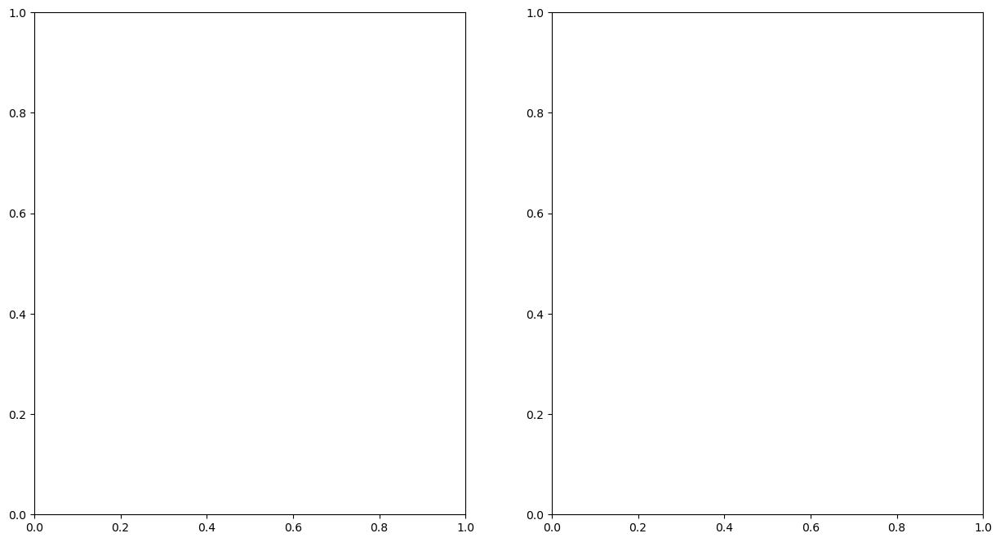

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

df_plot= chm13.groupby(['Type'])['Lenght']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[0], log=True, alpha=0.5) # alpha for transparency

plt.xscale('log')
#plt.show()

df_plot = chm13.groupby(['Type'])['Lenght']

df_plot.plot(kind='hist',stacked=True, bins=100, legend=True, ax=axs[1], log=True, alpha=0.5) # alpha for transparency

plt.show()

In [ ]:
chm13['Lenght'].describe()

In [20]:
## Replacing chromosome names 
dict_chr = dict(zip(report['GenBank-Accn'], report['Assigned-Molecule']))
dict_chr#[final_cnv['Chromosome']== 'CP068254.1']

{'CP068277.2': '1',
 'CP068276.2': '2',
 'CP068275.2': '3',
 'CP068274.2': '4',
 'CP068273.2': '5',
 'CP068272.2': '6',
 'CP068271.2': '7',
 'CP068270.2': '8',
 'CP068269.2': '9',
 'CP068268.2': '10',
 'CP068267.2': '11',
 'CP068266.2': '12',
 'CP068265.2': '13',
 'CP068264.2': '14',
 'CP068263.2': '15',
 'CP068262.2': '16',
 'CP068261.2': '17',
 'CP068260.2': '18',
 'CP068259.2': '19',
 'CP068258.2': '20',
 'CP068257.2': '21',
 'CP068256.2': '22',
 'CP068255.2': 'X',
 'CP086569.2': 'Y',
 'CP068254.1': 'MT'}

In [13]:
#subsetting deletions and duplications
#deletions = chm13[chm13['Type'] =='deletion']
#duplications = chm13[chm13['Type'] == 'duplication']
#deletions

In [17]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample', 
                    values='Score',
                        fill_value=2).reset_index()


final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,CP068254.1,0,1000,755,729,817,921,947,792,695,...,91,728,847,217,171,217,725,731,1022,227
1,CP068254.1,1000,2228,778,741,836,946,989,814,717,...,93,759,879,226,179,223,773,754,1135,243
2,CP068254.1,2228,3378,703,704,780,885,936,765,670,...,82,696,829,205,155,197,708,684,1024,221
3,CP068254.1,3378,4522,724,706,799,898,945,784,687,...,85,735,845,214,168,211,735,709,1085,228
4,CP068254.1,4522,5522,795,762,868,972,1025,838,742,...,90,766,901,219,177,225,791,766,1182,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1012811,CP086569.2,62447554,62448825,18,24,22,22,19,23,25,...,25,17,21,24,24,23,19,21,22,23
1012812,CP086569.2,62448825,62449825,19,25,22,24,21,25,27,...,25,19,22,25,24,23,19,22,22,24
1012813,CP086569.2,62449825,62450825,21,27,24,26,21,25,29,...,27,20,24,26,27,27,23,26,26,26
1012814,CP086569.2,62450825,62451825,20,26,23,25,21,24,27,...,26,19,22,25,28,28,22,27,26,28


In [21]:
final_cnv['Chromosome'] =  final_cnv['Chromosome'].replace(dict_chr)
final_cnv = final_cnv[~final_cnv['Chromosome'].isin(['MT', 'X', 'Y'])]


final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
47804,22,0,20541,28,30,32,35,32,29,33,...,30,33,33,37,34,38,30,32,33,32
47805,22,20541,22327,28,31,32,35,32,28,32,...,30,33,34,35,34,38,31,32,33,34
47806,22,22327,23327,26,29,31,32,29,26,31,...,27,29,30,31,30,32,24,28,28,30
47807,22,23327,25569,20,21,23,25,23,20,24,...,21,22,23,24,22,24,18,21,21,22
47808,22,25569,26687,13,13,15,17,14,13,15,...,14,14,14,14,14,15,10,13,14,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004612,1,248364795,248366351,23,26,27,29,26,23,28,...,25,25,26,28,28,32,25,26,28,28
1004613,1,248366351,248367622,27,31,29,29,29,27,28,...,28,28,26,33,31,31,29,24,26,33
1004614,1,248367622,248368745,23,27,27,29,26,24,27,...,25,25,27,29,26,28,24,23,25,30
1004615,1,248368745,248370339,35,41,39,43,41,37,40,...,39,42,41,48,42,45,39,37,39,42


In [ ]:
final_cnv

In [ ]:
## input for CNVRanger 
#cnvrangerchm13 = chm13[['Sample','Chromosome', 'Start', 'End','Score']]
#cnvrangerchm13['Chromosome'] =  cnvrangerchm13['Chromosome'].replace(dict_chr)
#cnvrangerchm13.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']

#cnvrangerchm13['CNV_Value'] = cnvrangerchm13['CNV_Value'].astype(int)
#cnvrangerchm13.to_csv('../data/chm13_cnvranger_input.csv',  index=False)

In [ ]:
cnvrangerchm13

In [ ]:
LP6005441 = final_cnv[['Chromosome','Start','End','Type', 'LP6005441-DNA_B10']]
LP6005441.sort_values(by='LP6005441-DNA_B10', ascending=False).head(50)

<h1> Removing cnvs from exclusion regions 

In [22]:
black_header = ['Chromosome','Start', 'End', 'Type', 'Extra1', 'Extra2']
blacklist = pd.read_table('/Users/luciabazan/Downloads/T2T.excluderanges.bed', names=black_header)
blacklist['Chromosome'] = blacklist['Chromosome'].str.replace('chr', '')
blacklist = blacklist.drop(columns=['Extra1', 'Extra2'])
blacklist_ranges = PyRanges(blacklist)

In [23]:
final_cnv_ranges = PyRanges(final_cnv)
final_cnv = final_cnv_ranges.overlap(blacklist_ranges, invert=True)
final_cnv = final_cnv.as_df()
#final_cnv.to_csv('../data/T2TCHM13_cnvs.csv.zip', compression="zip")
final_cnv

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,1,260453,261566,4,4,3,4,4,4,4,...,4,4,4,4,4,4,3,2,3,4
1,1,261566,263205,4,4,3,4,4,4,4,...,4,4,4,4,3,4,4,3,3,4
2,1,263205,264505,3,4,3,4,4,4,4,...,4,4,3,3,3,3,3,4,3,3
3,1,264505,269912,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
4,1,269912,271404,3,4,4,4,3,3,4,...,4,4,4,4,4,4,3,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
920286,22,51288688,51289688,4,4,4,4,4,4,5,...,4,4,4,4,4,5,4,5,4,5
920287,22,51289688,51291273,4,4,4,4,4,4,5,...,4,4,4,4,4,4,4,4,4,4
920288,22,51291273,51292827,4,4,4,4,4,4,5,...,4,4,4,4,4,5,4,4,4,5
920289,22,51292827,51295018,4,4,4,4,4,4,5,...,4,4,3,4,4,4,4,4,4,4


In [24]:
d = final_cnv.fillna(2)
#d.to_csv('../data/t2tchm13_all_pivot.bed', sep='\t', header=False, index=False )
d

Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,1,260453,261566,4,4,3,4,4,4,4,...,4,4,4,4,4,4,3,2,3,4
1,1,261566,263205,4,4,3,4,4,4,4,...,4,4,4,4,3,4,4,3,3,4
2,1,263205,264505,3,4,3,4,4,4,4,...,4,4,3,3,3,3,3,4,3,3
3,1,264505,269912,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
4,1,269912,271404,3,4,4,4,3,3,4,...,4,4,4,4,4,4,3,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
920286,22,51288688,51289688,4,4,4,4,4,4,5,...,4,4,4,4,4,5,4,5,4,5
920287,22,51289688,51291273,4,4,4,4,4,4,5,...,4,4,4,4,4,4,4,4,4,4
920288,22,51291273,51292827,4,4,4,4,4,4,5,...,4,4,4,4,4,5,4,4,4,5
920289,22,51292827,51295018,4,4,4,4,4,4,5,...,4,4,3,4,4,4,4,4,4,4


Sample,Chromosome,Start,End,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,chr1,260453,261566,4,4,3,4,4,4,4,...,4,4,4,4,4,4,3,2,3,4
1,chr1,261566,263205,4,4,3,4,4,4,4,...,4,4,4,4,3,4,4,3,3,4
2,chr1,263205,264505,3,4,3,4,4,4,4,...,4,4,3,3,3,3,3,4,3,3
3,chr1,264505,269912,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
4,chr1,269912,271404,3,4,4,4,3,3,4,...,4,4,4,4,4,4,3,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
920286,chr22,51288688,51289688,4,4,4,4,4,4,5,...,4,4,4,4,4,5,4,5,4,5
920287,chr22,51289688,51291273,4,4,4,4,4,4,5,...,4,4,4,4,4,4,4,4,4,4
920288,chr22,51291273,51292827,4,4,4,4,4,4,5,...,4,4,4,4,4,5,4,4,4,5
920289,chr22,51292827,51295018,4,4,4,4,4,4,5,...,4,4,3,4,4,4,4,4,4,4


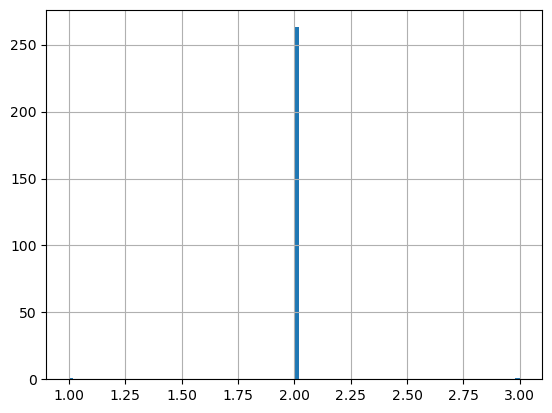

In [25]:
d.iloc[81275,4:280].hist(bins=100)
d['Chromosome'] = 'chr' + d['Chromosome'].astype(str)
d

In [24]:
## Saving CNVs coordinates as bed file to liftover
d.iloc[:,0:4].to_csv('cnvs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')

In [ ]:
columns = d.columns
np.savetxt("../data/t2tchm13_all_pivot_names.bed", columns,
           delimiter ="/t", 
           fmt ='% s')

<h1> PCA 

In [25]:
#final_cnv = final_cnv.iloc[new]
final = final_cnv.iloc[:,4:287]
counts = final
counts = counts.fillna(2)
counts
#sns.displot(penguins, 


Sample,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,4,4,3,4,4,4,4,2,4,4,...,4,4,4,4,4,4,3,2,3,4
1,4,4,3,4,4,4,4,3,4,4,...,4,4,4,4,3,4,4,3,3,4
2,3,4,3,4,4,4,4,3,4,3,...,4,4,3,3,3,3,3,4,3,3
3,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4
4,3,4,4,4,3,3,4,4,4,4,...,4,4,4,4,4,4,3,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1116019,4,4,4,4,4,4,5,4,4,4,...,4,4,4,4,4,4,4,4,4,4
1116020,4,4,4,4,4,4,5,4,4,4,...,4,4,4,4,4,5,4,4,4,5
1116021,4,4,4,4,4,4,5,4,4,4,...,4,4,3,4,4,4,4,4,4,4
1116022,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2


In [26]:
counts = counts.T
counts = counts.sort_index()
counts

,0,1,2,3,4,5,6,7,8,9,...,1116014,1116015,1116016,1116017,1116018,1116019,1116020,1116021,1116022,1116023
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,4,4,3,4,3,3,4,4,4,4,...,2,3,4,3,4,4,4,4,2,4
LP6005441-DNA_A03,4,4,4,4,4,4,4,4,4,4,...,2,4,4,4,4,4,4,4,2,4
LP6005441-DNA_A04,3,3,3,4,4,4,4,4,4,4,...,2,4,4,4,4,4,4,4,2,4
LP6005441-DNA_A05,4,4,4,4,4,4,4,4,4,4,...,2,4,4,3,4,4,4,4,2,4
LP6005441-DNA_A06,4,4,4,4,3,3,4,4,4,4,...,2,4,4,4,4,4,4,4,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,4,4,3,4,4,4,4,3,4,4,...,2,4,4,4,5,4,5,4,2,5
SS6004471,3,4,3,4,3,4,3,4,4,4,...,2,4,4,4,4,4,4,4,2,5
SS6004477,2,3,4,4,4,4,4,3,4,4,...,2,4,4,4,5,4,4,4,2,5


In [27]:
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

,Region
Sample,
LP6005441-DNA_A01,WestEurasia
LP6005441-DNA_A03,Oceania
LP6005441-DNA_A04,America
LP6005441-DNA_A05,WestEurasia
LP6005441-DNA_A06,WestEurasia
...,...
LP6007069-DNA_A01,WestEurasia
SS6004471,Africa
SS6004477,Oceania


In [ ]:
#PCA

pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

In [ ]:
pca.explained_variance_ratio_

In [ ]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    

<h1> VST

In [ ]:
#coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,4:287]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

In [ ]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

<h1> New Vst

In [30]:
####### Groupby regions #######
dt_group = dt.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
regions.sort()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

dt_groupped

[                   Region  0  1  2  3  4  5  6  7  8  ...  1116014  1116015  \
 Sample                                                ...                     
 LP6005441-DNA_A08  Africa  4  4  4  4  3  4  4  4  4  ...        2        4   
 LP6005441-DNA_A11  Africa  4  4  4  4  4  4  4  4  4  ...        2        4   
 LP6005441-DNA_B02  Africa  5  5  4  5  5  4  4  4  4  ...        2        4   
 LP6005441-DNA_B08  Africa  4  4  4  4  4  3  4  4  4  ...        2        4   
 LP6005441-DNA_B11  Africa  4  4  4  4  4  3  3  4  4  ...        2        4   
 LP6005441-DNA_E07  Africa  4  4  3  4  4  4  4  4  4  ...        2        4   
 LP6005441-DNA_F01  Africa  4  4  3  4  4  4  4  4  3  ...        2        4   
 LP6005441-DNA_F07  Africa  4  4  3  4  3  4  4  4  4  ...        2        3   
 LP6005441-DNA_G02  Africa  4  4  4  4  4  4  4  4  4  ...        2        4   
 LP6005441-DNA_G08  Africa  4  4  3  4  4  3  4  4  3  ...        2        4   
 LP6005441-DNA_H02  Africa  4  4  4  4  

In [31]:
#### Names to pair-population
regions = dt['Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

for j in dt_groupped:
    del j['Region']


In [32]:
## Function for Vst 
def vst_function(
    x=None, 
    y=None):

    vx = np.var(x, axis=0)
    vy = np.var(y, axis=0)

    nx = len(x)
    ny = len(y)

## Vt 
    a = np.concatenate((x,y))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    return(vst) 


combination_regions = list(combinations([0,1,2,3,4,5,6],2))

vst_list = []
for region in combination_regions:
    vx = np.var(dt_groupped[region[0]])
    vy = np.var(dt_groupped[region[1]])

    nx = len(dt_groupped[region[0]])
    ny = len(dt_groupped[region[1]])

## Vt 
    a = np.concatenate((dt_groupped[region[0]], dt_groupped[region[1]]))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    vst_list.append(vst)

In [55]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
vst_dt

,0,1,2,3,4,5,6,7,8,9,...,1116014,1116015,1116016,1116017,1116018,1116019,1116020,1116021,1116022,1116023
Africa-America,0.202498,0.240293,0.022848,0.002241,0.015222,0.021201,0.000381,0.069492,0.063234,0.001931,...,NaN,0.008766,0.008130,0.036901,0.002680,0.004558,0.004558,0.034167,NaN,0.000015
Africa-CentralAsiaSiberia,0.008256,0.015035,0.040285,0.001386,0.051488,0.025338,0.088635,0.007480,0.074203,0.000003,...,NaN,0.000900,0.009829,0.005728,0.000661,0.009829,0.014013,0.046016,NaN,0.012873
Africa-EastAsia,0.083757,0.071167,0.058029,0.001420,0.047963,0.005960,0.055477,0.005328,0.092752,0.009636,...,0.010719,0.005323,0.000017,0.006330,0.004661,0.000017,0.007769,0.002124,0.010719,0.005226
Africa-Oceania,0.515763,0.555743,0.026511,0.002937,0.005774,0.001439,0.006977,0.118841,0.034086,0.003464,...,NaN,0.002836,0.008904,0.000680,0.001363,0.008904,0.008904,NaN,NaN,0.009350
Africa-SouthAsia,0.000019,0.002738,0.025091,0.008451,0.077678,0.008243,0.045560,0.001955,0.056536,0.009358,...,NaN,0.002971,0.000038,0.002373,0.023458,0.011882,0.011882,0.013833,NaN,0.000163
Africa-WestEurasia,0.006468,0.000000,0.000325,0.000180,0.009698,0.001181,0.026217,0.000560,0.021060,0.001360,...,NaN,0.003978,0.015679,0.006012,0.001728,0.019140,0.000483,0.003379,NaN,0.000377
America-CentralAsiaSiberia,0.161123,0.123627,0.003438,0.005769,0.021759,0.000272,0.084799,0.043336,0.005291,0.002371,...,NaN,0.005089,NaN,0.075789,0.016103,0.029348,0.002371,0.002371,NaN,0.016218
America-EastAsia,0.036677,0.038055,0.006609,0.004956,0.012037,0.004376,0.042249,0.004381,0.006944,0.015394,...,0.006944,0.000167,0.001372,0.052419,0.000979,0.001799,0.012037,0.001799,0.006944,0.004381
America-Oceania,0.166597,0.117565,0.000079,0.027381,0.005236,0.014229,0.011288,0.011320,0.020704,0.000239,...,NaN,0.002243,NaN,0.037174,0.020704,0.027381,0.027381,0.027381,NaN,0.012246
America-SouthAsia,0.227672,0.190532,0.000023,0.019079,0.036735,0.037474,0.035185,0.023275,0.001300,0.016211,...,NaN,0.002123,0.009234,0.024783,0.018797,0.033333,0.033333,0.003806,NaN,0.000067


In [56]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst = filtering_vst.T
filtering_vst#.tail(50)#.iloc[[1112231]]
#filtering_vst#.iloc[[21]]
#filtering_vst.loc[21]
#filtering_vst.loc[1112231]

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,True,False,False,True,False,False,False,False,False,True,...,False,True,False,False,True,False,False,True,True,False
1,True,False,False,True,False,False,False,False,False,False,...,False,True,False,False,True,False,False,True,True,False
21,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
28,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
29,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1113136,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1114156,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
1114474,True,False,False,True,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1114476,True,True,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False


In [57]:
filtering_vst = pd.DataFrame(vst_dt)>=0.3
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst = filtering_vst.T
filtering_vst#.tail(50)#.iloc[[1112231]]
#filtering_vst#.iloc[[21]]
#filtering_vst.loc[21]
#filtering_vst.loc[1112231]

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,False,False,False,True,False,False,False,False,False,False,...,False,True,False,False,True,False,False,True,True,False
1,False,False,False,True,False,False,False,False,False,False,...,False,True,False,False,False,False,False,True,True,False
31,False,False,False,True,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
32,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,True,False,False
84,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1112833,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1112834,True,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1114474,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1114476,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [43]:
filtering_vst

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,False,False,False,True,False,False,False,False,False,False,...,False,True,False,False,False,False,False,True,True,False
1,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False
32,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
2089,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2095,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1109029,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1109051,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,True,False
1110203,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1114474,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [44]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', final_cnv['Chromosome'])
vst_dt.insert (1, 'Start', final_cnv['Start'])
vst_dt.insert (2, 'End', final_cnv['End'])
vst_dt.insert (3, 'Type', final_cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,Type,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,1,260453,261566,duplication,0.20250,0.00826,0.08376,0.51576,0.00002,0.00647,...,0.04714,0.46687,0.01258,0.02037,0.32429,0.09181,0.11354,0.53687,0.51986,0.00809
1,1,261566,263205,duplication,0.24029,0.01503,0.07117,0.55574,0.00274,0.00000,...,0.02009,0.39865,0.00525,0.00772,0.24498,0.04857,0.05455,0.49563,0.39749,0.00133
2,1,263205,264505,duplication,0.02285,0.04029,0.05803,0.02651,0.02509,0.00032,...,0.00038,0.00269,0.00282,0.02774,0.00568,0.00630,0.04462,0.00001,0.01531,0.01705
3,1,264505,269912,duplication,0.00224,0.00139,0.00142,0.00294,0.00845,0.00018,...,0.00000,0.00000,0.00157,0.00022,0.00000,0.00159,0.00028,0.00333,0.00026,0.00251
4,1,269912,271404,duplication,0.01522,0.05149,0.04796,0.00577,0.07768,0.00970,...,0.00047,0.03834,0.00358,0.01881,0.02597,0.00676,0.01678,0.05647,0.00051,0.03922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1116019,22,51289688,51291273,duplication,0.00456,0.00983,0.00002,0.00890,0.01188,0.01914,...,0.00167,0.00000,0.00000,0.00383,0.00151,0.00204,0.00602,0.00000,0.00340,0.00484
1116020,22,51291273,51292827,duplication,0.00456,0.01401,0.00777,0.00890,0.01188,0.00048,...,0.02240,0.03549,0.04468,0.01029,0.00151,0.00204,0.00361,0.00000,0.00067,0.00096
1116021,22,51292827,51295018,duplication,0.03417,0.04602,0.00212,0.00000,0.01383,0.00338,...,0.00660,0.03549,0.01258,0.00537,0.00151,0.00006,0.00008,0.01009,0.00226,0.00001
1116022,22,51295018,51296018,deletion,0.00000,0.00000,0.01072,0.00000,0.00000,0.00000,...,0.00845,0.00000,0.00000,0.00000,0.00763,0.01030,0.01379,0.00000,0.00000,0.00000


In [45]:
vst_dt['Chromosome'] = 'chr' + vst_dt['Chromosome'].astype(str)
vst_dt

,Chromosome,Start,End,Type,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,chr1,260453,261566,duplication,0.20250,0.00826,0.08376,0.51576,0.00002,0.00647,...,0.04714,0.46687,0.01258,0.02037,0.32429,0.09181,0.11354,0.53687,0.51986,0.00809
1,chr1,261566,263205,duplication,0.24029,0.01503,0.07117,0.55574,0.00274,0.00000,...,0.02009,0.39865,0.00525,0.00772,0.24498,0.04857,0.05455,0.49563,0.39749,0.00133
2,chr1,263205,264505,duplication,0.02285,0.04029,0.05803,0.02651,0.02509,0.00032,...,0.00038,0.00269,0.00282,0.02774,0.00568,0.00630,0.04462,0.00001,0.01531,0.01705
3,chr1,264505,269912,duplication,0.00224,0.00139,0.00142,0.00294,0.00845,0.00018,...,0.00000,0.00000,0.00157,0.00022,0.00000,0.00159,0.00028,0.00333,0.00026,0.00251
4,chr1,269912,271404,duplication,0.01522,0.05149,0.04796,0.00577,0.07768,0.00970,...,0.00047,0.03834,0.00358,0.01881,0.02597,0.00676,0.01678,0.05647,0.00051,0.03922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1116019,chr22,51289688,51291273,duplication,0.00456,0.00983,0.00002,0.00890,0.01188,0.01914,...,0.00167,0.00000,0.00000,0.00383,0.00151,0.00204,0.00602,0.00000,0.00340,0.00484
1116020,chr22,51291273,51292827,duplication,0.00456,0.01401,0.00777,0.00890,0.01188,0.00048,...,0.02240,0.03549,0.04468,0.01029,0.00151,0.00204,0.00361,0.00000,0.00067,0.00096
1116021,chr22,51292827,51295018,duplication,0.03417,0.04602,0.00212,0.00000,0.01383,0.00338,...,0.00660,0.03549,0.01258,0.00537,0.00151,0.00006,0.00008,0.01009,0.00226,0.00001
1116022,chr22,51295018,51296018,deletion,0.00000,0.00000,0.01072,0.00000,0.00000,0.00000,...,0.00845,0.00000,0.00000,0.00000,0.00763,0.01030,0.01379,0.00000,0.00000,0.00000


In [46]:
#vst_dt = vst_dt.drop([46387])
vst_dt.sort_values(by=['CentralAsiaSiberia-SouthAsia'], ascending=True).head(50)

,Chromosome,Start,End,Type,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
558011,chr8,67301080,67305355,deletion,0.00000,0.00000,0.01072,0.00000,0.00000,0.00508,...,0.00845,0.00000,0.0,0.00383,0.00763,0.0103,0.00098,0.00000,0.00340,0.00484
630028,chr9,115374387,115376211,deletion,0.00000,0.00000,0.00000,0.00000,0.00000,0.00508,...,0.00000,0.00000,0.0,0.00383,0.00000,0.0000,0.00539,0.00000,0.00340,0.00484
630029,chr9,115374387,115376211,duplication,0.00000,0.00000,0.00000,0.00000,0.00000,0.00508,...,0.00000,0.00000,0.0,0.00383,0.00000,0.0000,0.00539,0.00000,0.00340,0.00484
1043236,chr20,5993709,5995395,duplication,0.00000,0.00000,0.00000,0.00000,0.00000,0.00508,...,0.00000,0.00000,0.0,0.00383,0.00000,0.0000,0.00539,0.00000,0.00340,0.00484
630032,chr9,115380324,115388290,deletion,0.03417,0.00000,0.00000,0.00000,0.00000,0.01026,...,0.00000,0.00000,0.0,0.00773,0.00000,0.0000,0.01087,0.00000,0.00687,0.00977
1043235,chr20,5993709,5995395,deletion,0.00000,0.00000,0.01072,0.00000,0.00000,0.00000,...,0.00845,0.00000,0.0,0.00000,0.00763,0.0103,0.01379,0.00000,0.00000,0.00000
630034,chr9,115389921,115391189,duplication,0.00813,0.00983,0.01291,0.00890,0.01188,0.00147,...,0.00000,0.00000,0.0,0.00383,0.00000,0.0000,0.00539,0.00000,0.00340,0.00484
630035,chr9,115391189,115392708,duplication,0.00813,0.00983,0.01291,0.00890,0.01188,0.01568,...,0.00000,0.00000,0.0,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000
630036,chr9,115392708,115394135,deletion,0.00000,0.00000,0.00000,0.00000,0.00000,0.00508,...,0.00000,0.00000,0.0,0.00383,0.00000,0.0000,0.00539,0.00000,0.00340,0.00484
630037,chr9,115392708,115394135,duplication,0.00813,0.00983,0.01291,0.00890,0.01188,0.01568,...,0.00000,0.00000,0.0,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000


In [ ]:
vst_dt.to_csv('../data/vst_results_t2tchm13.csv', index=False)

In [ ]:
vst_dt

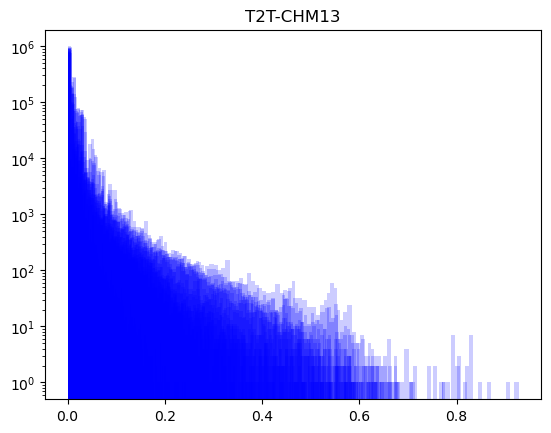

In [47]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,4:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')

In [ ]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, bins=100, alpha=0.2, color="blue", log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

In [ ]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [ ]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)
vst_dt_filtered.to_csv('vst_candidates_chm13t2t.csv', index=False)
vst_dt_filtered

In [ ]:
vst_dt_filtered.tail(50)

In [ ]:
chr22 = vst_dt_filtered[vst_dt_filtered['Chromosome']== 'chr22']
target = chr22[chr22['Start'] == 45644771]#.hist()
target.iloc[:,4:30].T.describe()
#45644771
#End_b                                            45648303

In [ ]:
vst_dt_filtered.iloc[:,4:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [ ]:
#sns.set_palette("bright")
for i in vst_dt_filtered.iloc[:,4:25].columns:
    plt.hist(vst_dt_filtered[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')

In [ ]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='Oceania-WestEurasia', aspect=3.7, 
                  hue='Chromosome', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('Chromosome')['i'].median()
plot.ax.set_xlabel('Chromosome'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('T2T-CHM13 WestEurasia-Oceania Vst values');

In [ ]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:4].to_csv('vst_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')

In [ ]:
vst_dt_filtered.sort_values(by=['CentralAsiaSiberia-SouthAsia'], ascending=True).head(50)

In [95]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst = filtering_vst.T
filtering_vst#.tail(50)#.iloc[[1112231]]
#filtering_vst#.iloc[[21]]
#filtering_vst.loc[21]
#filtering_vst.loc[1112231]

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,True,False,False,True,False,False,False,False,False,True,...,False,True,False,False,True,False,False,True,True,False
1,True,False,False,True,False,False,False,False,False,False,...,False,True,False,False,True,False,False,True,True,False
21,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
28,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
29,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1113136,False,False,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1114156,False,False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
1114474,True,False,False,True,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
1114476,True,True,False,False,False,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False


<h1> Deletions 

In [96]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.index]
cnv_passed_vst

Sample,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,LP6005441-DNA_A09,LP6005441-DNA_A10,LP6005441-DNA_A11,LP6005441-DNA_A12,...,LP6005677-DNA_D03,LP6005677-DNA_E01,LP6005677-DNA_F01,LP6005677-DNA_G01,LP6007068-DNA_A01,LP6007069-DNA_A01,SS6004471,SS6004477,SS6004478,SS6004480
0,4,4,3,4,4,4,4,2,4,4,...,4,4,4,4,4,4,3,2,3,4
1,4,4,3,4,4,4,4,3,4,4,...,4,4,4,4,3,4,4,3,3,4
21,11,12,12,12,11,11,11,13,10,11,...,10,11,11,12,11,11,10,10,11,12
28,9,10,10,10,10,9,9,10,10,9,...,10,9,9,10,9,10,11,10,9,11
29,14,15,14,16,15,13,13,15,15,14,...,14,13,13,17,13,16,17,16,14,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1113136,2,3,2,2,2,2,2,2,2,2,...,2,2,3,3,2,2,2,2,2,2
1114156,1,2,1,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,1,1
1114474,3,4,3,3,3,5,3,3,4,3,...,5,3,3,5,5,4,3,3,3,4
1114476,3,3,2,3,2,3,2,2,3,2,...,3,2,2,4,3,2,2,2,2,3


In [97]:
cnvs

,0,1,2,3,4,5,6,7,8,9,...,1116014,1116015,1116016,1116017,1116018,1116019,1116020,1116021,1116022,1116023
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,4,4,3,4,3,3,4,4,4,4,...,2,3,4,3,4,4,4,4,2,4
LP6005441-DNA_A03,4,4,4,4,4,4,4,4,4,4,...,2,4,4,4,4,4,4,4,2,4
LP6005441-DNA_A04,3,3,3,4,4,4,4,4,4,4,...,2,4,4,4,4,4,4,4,2,4
LP6005441-DNA_A05,4,4,4,4,4,4,4,4,4,4,...,2,4,4,3,4,4,4,4,2,4
LP6005441-DNA_A06,4,4,4,4,3,3,4,4,4,4,...,2,4,4,4,4,4,4,4,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,4,4,3,4,4,4,4,3,4,4,...,2,4,4,4,5,4,5,4,2,5
SS6004471,3,4,3,4,3,4,3,4,4,4,...,2,4,4,4,4,4,4,4,2,5
SS6004477,2,3,4,4,4,4,4,3,4,4,...,2,4,4,4,5,4,4,4,2,5


In [98]:
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,235,610,1750,2971,2983,2984,2985,3006,3507,3508,...,1109937,1110203,1110207,1111787,1112043,1112230,1112296,1112733,1114156,1114961
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,1,2,2,2,2,2,1,1,2,2,...,1,2,1,2,2,2,1,2,1,2
LP6005441-DNA_A03,2,1,2,2,2,2,2,2,2,2,...,1,2,1,2,2,2,1,2,2,2
LP6005441-DNA_A04,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,1,2,2,2,1,2
LP6005441-DNA_A05,2,1,2,2,2,2,2,1,2,2,...,1,2,2,2,2,2,2,2,2,2
LP6005441-DNA_A06,2,2,2,2,2,2,2,1,2,2,...,1,2,2,2,2,2,1,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,2,1,2,2,2,2,2,2,2,2,...,1,1,2,2,2,2,2,1,2,1
SS6004471,2,1,1,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,1,2,2
SS6004477,2,1,2,2,2,2,2,2,2,2,...,1,2,2,1,2,2,2,1,2,2


In [99]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.08704994, 0.0468433 , 0.0379389 , 0.02800395, 0.02239401,
       0.01880045, 0.01712079, 0.01512396, 0.01432641, 0.01212654])

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -7.168682    -1.433392    13.813166     3.621006     9.636043   
Oceania       -11.469066   -15.643315   -14.469856     1.506634    10.380743   
America        -8.515121   -10.389580    11.135262    -6.415615     1.930925   
WestEurasia    -5.948108     5.643517     7.865438     4.053170    -5.181580   
WestEurasia    -9.525563     7.251044     8.313841     2.954047    -3.407788   
...                  ...          ...          ...          ...          ...   
WestEurasia    22.428002     6.909994     4.037074     6.745860     5.583452   
Africa         -9.984591     8.093783   -16.951945   -10.898939     8.505338   
Oceania        -0.470107   -12.851146   -17.589435     5.556594    13.981656   
Oceania        -1.695346   -19.412616   -13.433295     8.611276    14.919345   
Africa          2.758191    16.811247   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -7.168682    -1.433392    13.813166     3.621006     9.636043   
Oceania       -11.469066   -15.643315   -14.469856     1.506634    10.380743   
America        -8.515121   -10.389580    11.135262    -6.415615     1.930925   
WestEurasia    -5.948108     5.643517     7.865438     4.053170    -5.181580   
WestEurasia    -9.525563     7.251044     8.313841     2.954047    -3.407788   
...                  ...          ...          ...          ...          ...   
WestEurasia    22.428002     6.909994     4.037074     6.745860     5.583452   
Africa         -9.984591     8.093783   -16.951945   -10.898939     8.505338   
Oceania        -0.470107   -12.851146   -17.589435     5.556594    13.981656   
Oceania        -1.695346   -19.412616   -13.433295     8.611276    14.919345   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -7.168682    -1.433392    13.813166     3.621006     9.636043   
Oceania       -11.469066   -15.643315   -14.469856     1.506634    10.380743   
America        -8.515121   -10.389580    11.135262    -6.415615     1.930925   
WestEurasia    -5.948108     5.643517     7.865438     4.053170    -5.181580   
WestEurasia    -9.525563     7.251044     8.313841     2.954047    -3.407788   
...                  ...          ...          ...          ...          ...   
WestEurasia    22.428002     6.909994     4.037074     6.745860     5.583452   
Africa         -9.984591     8.093783   -16.951945   -10.898939     8.505338   
Oceania        -0.470107   -12.851146   -17.589435     5.556594    13.981656   
Oceania        -1.695346   -19.412616   -13.433295     8.611276    14.919345   
Africa     

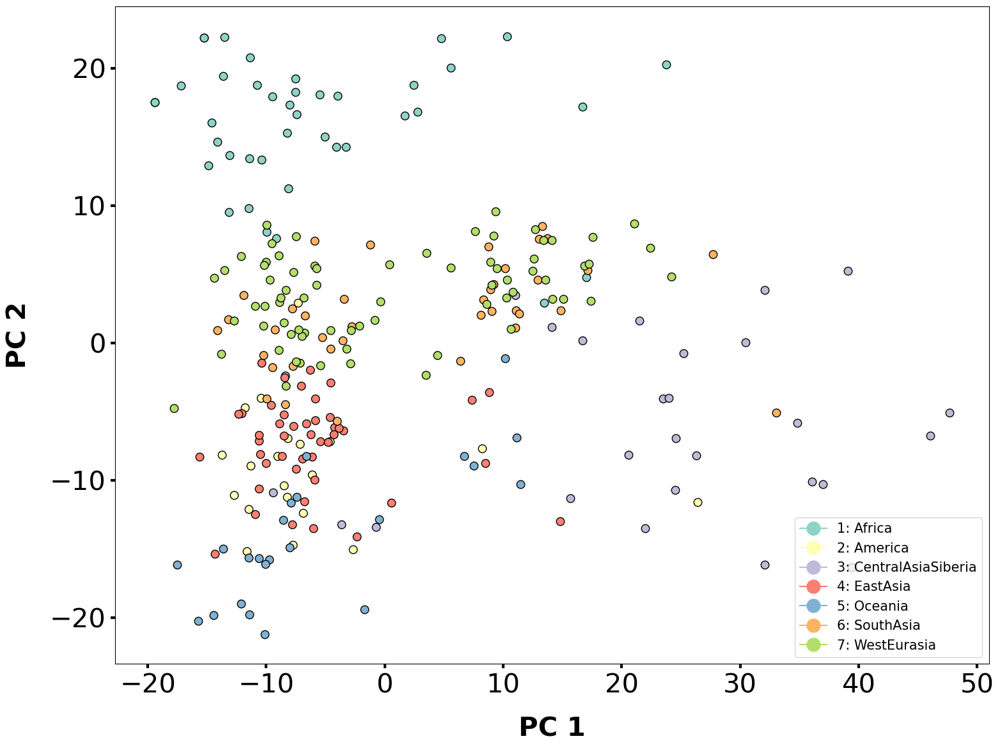

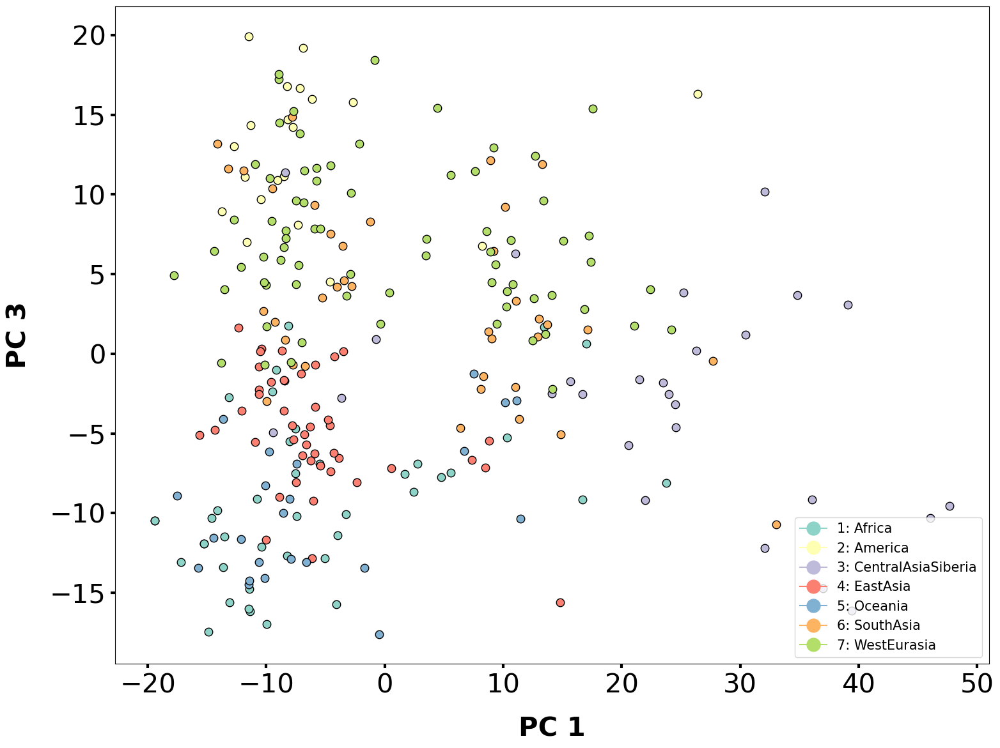

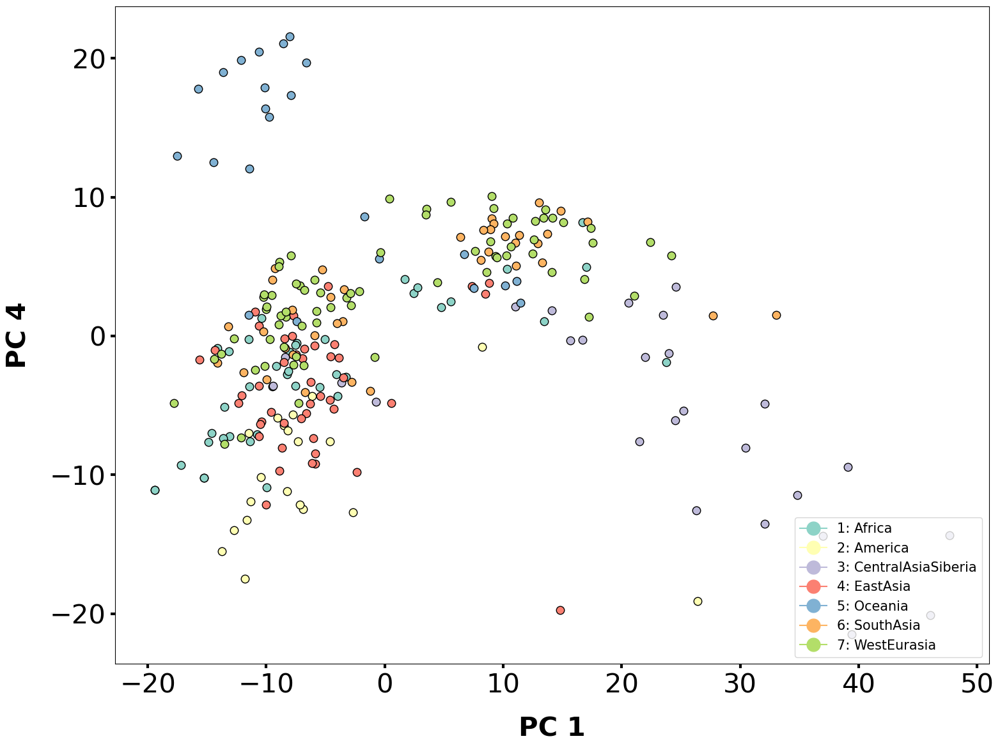

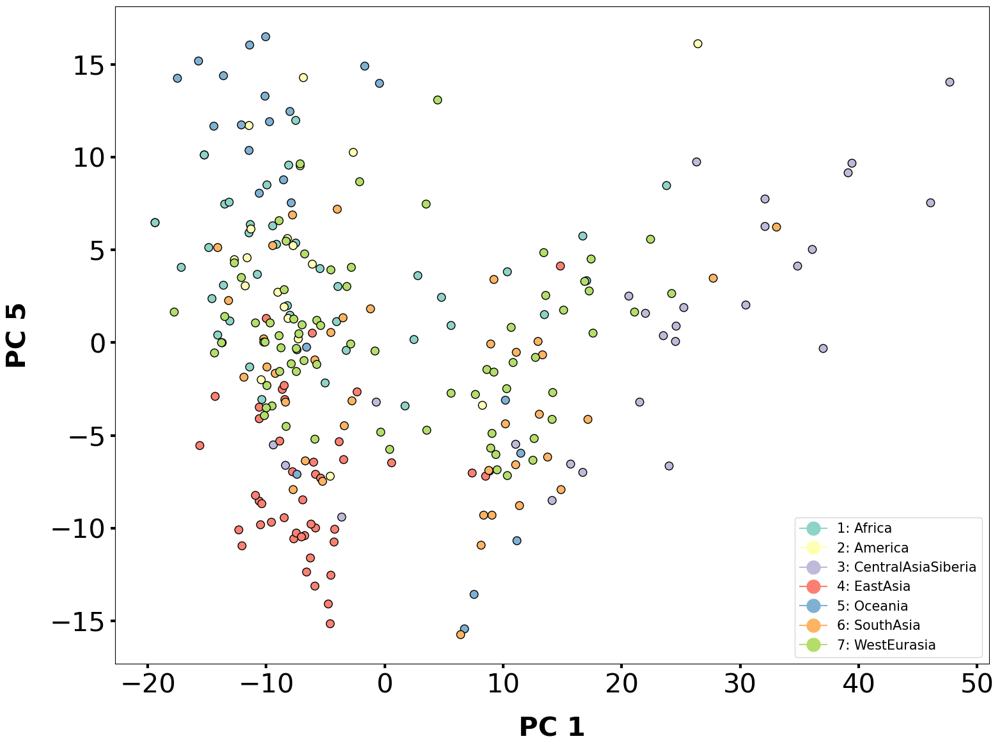

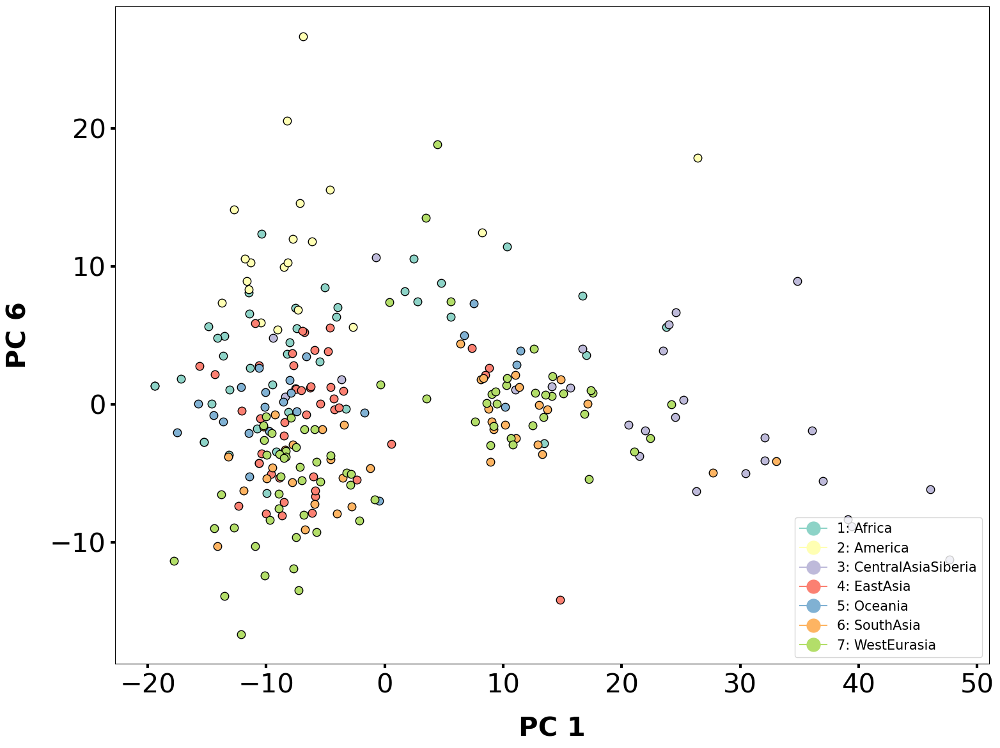

...

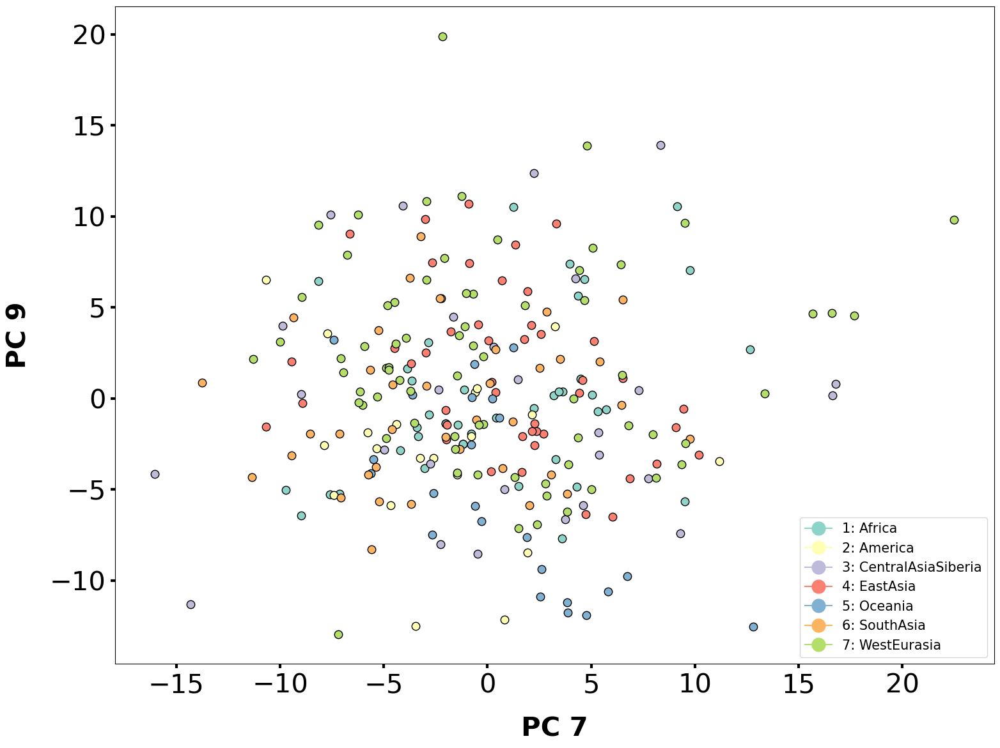

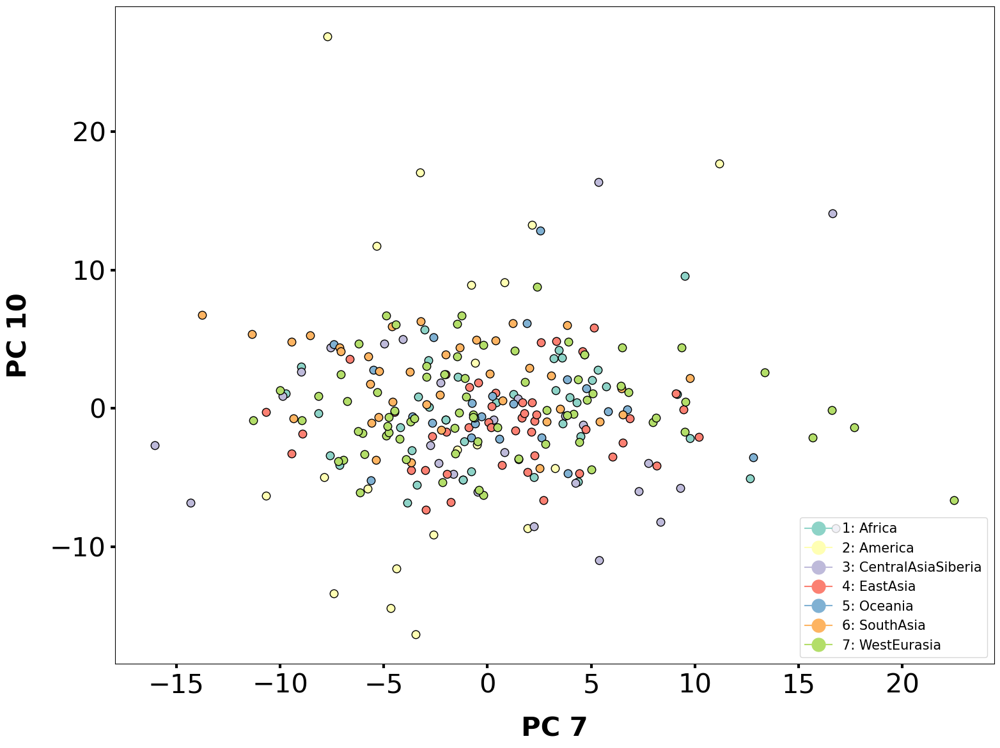

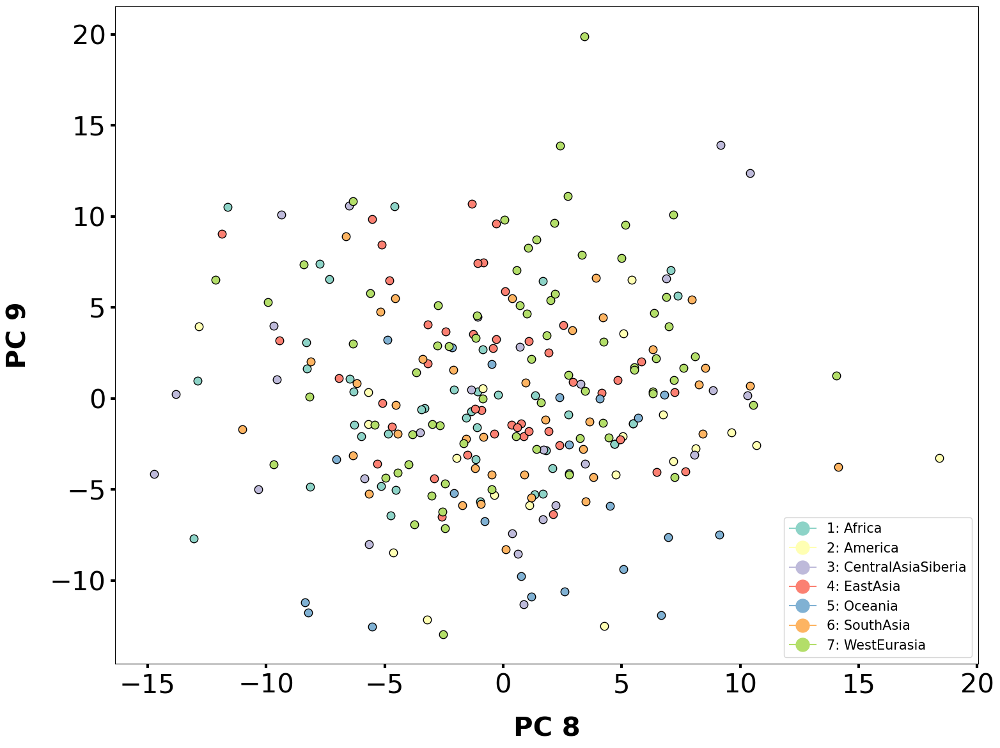

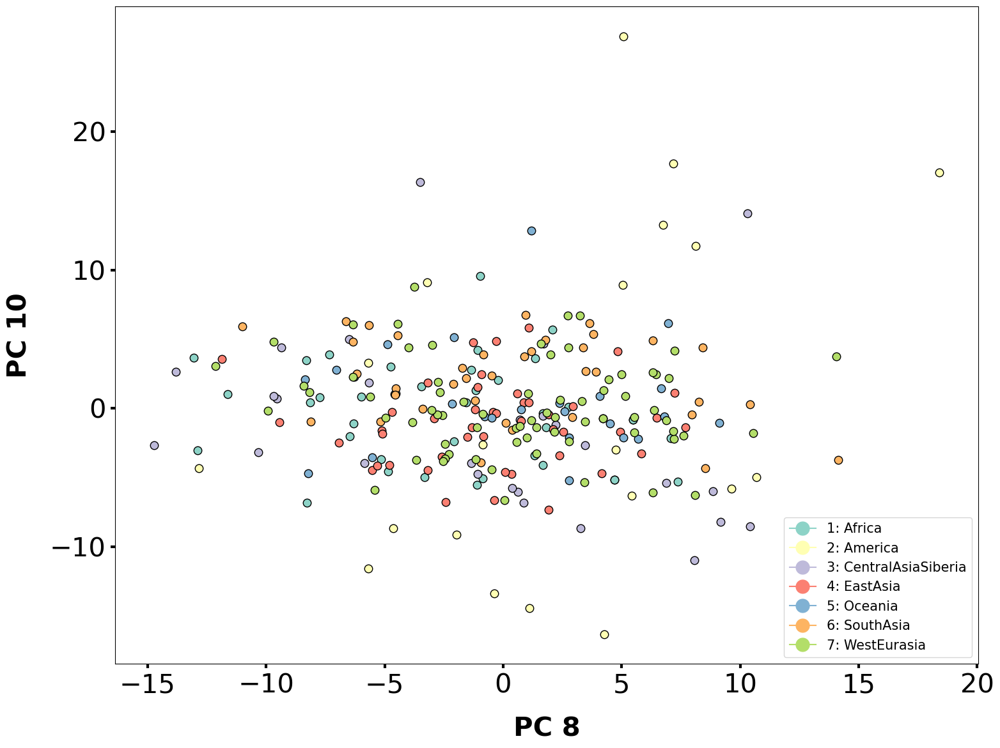

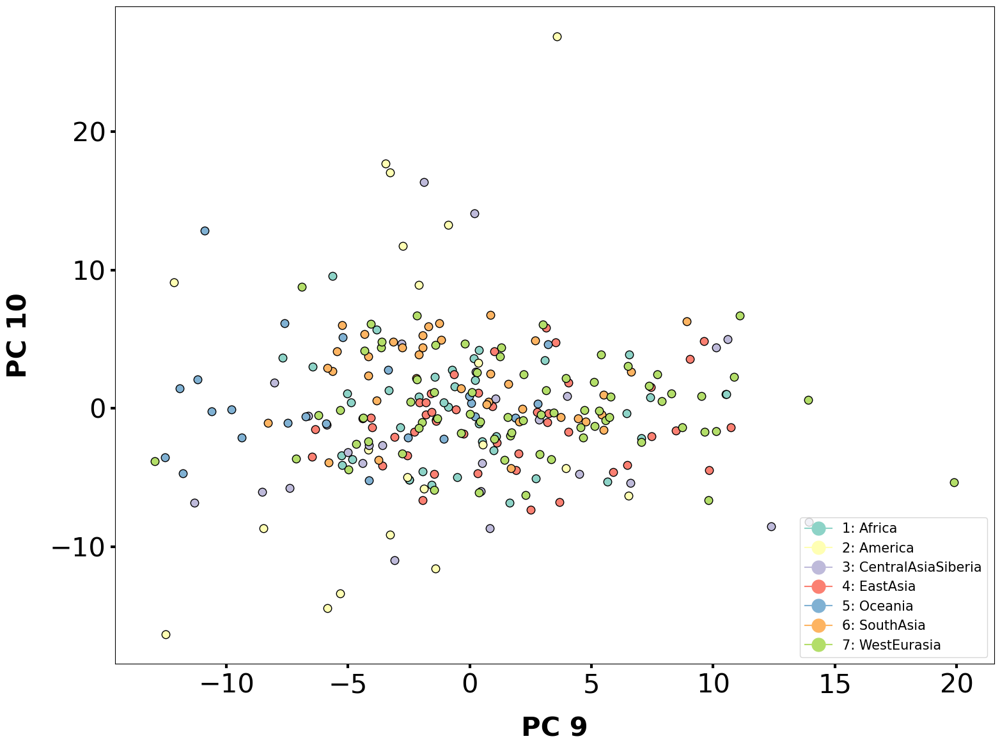

In [100]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -7.168682    -1.433392    13.813166     3.621006     9.636043   
Oceania       -11.469066   -15.643315   -14.469856     1.506634    10.380743   
America        -8.515121   -10.389580    11.135262    -6.415615     1.930925   
WestEurasia    -5.948108     5.643517     7.865438     4.053170    -5.181580   
WestEurasia    -9.525563     7.251044     8.313841     2.954047    -3.407788   
...                  ...          ...          ...          ...          ...   
WestEurasia    22.428002     6.909994     4.037074     6.745860     5.583452   
Africa         -9.984591     8.093783   -16.951945   -10.898939     8.505338   
Oceania        -0.470107   -12.851146   -17.589435     5.556594    13.981656   
Oceania        -1.695346   -19.412616   -13.433295     8.611276    14.919345   
Africa          2.758191    16.811247   

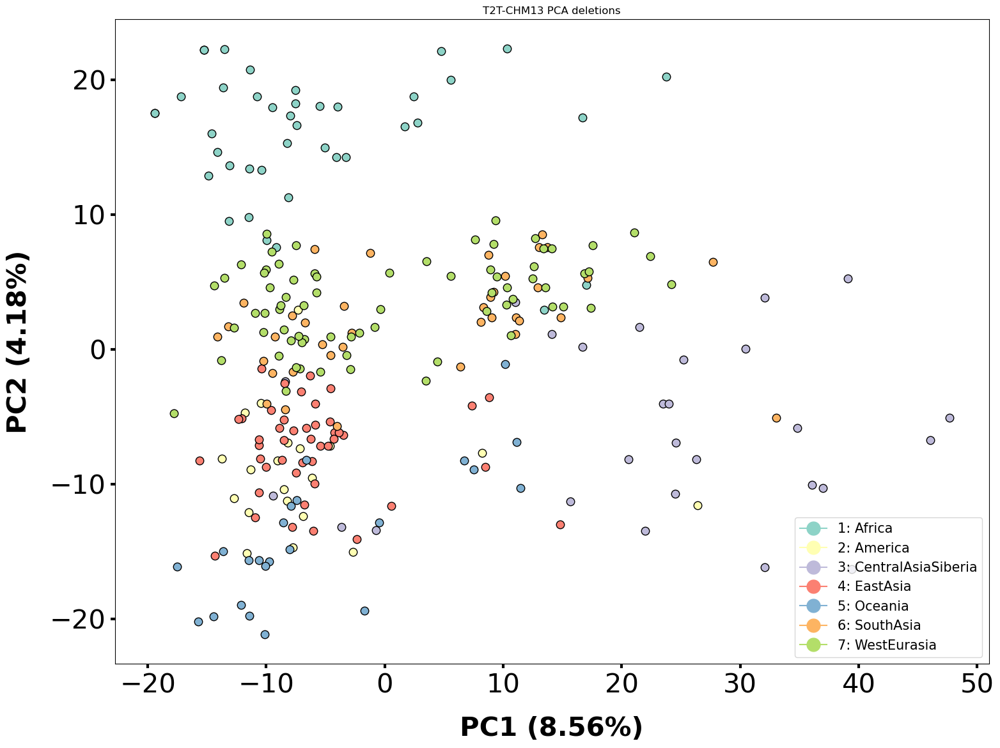

In [101]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (8.56%)', label_vertical='PC2 (4.18%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc12.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -7.168682    -1.433392    13.813166     3.621006     9.636043   
Oceania       -11.469066   -15.643315   -14.469856     1.506634    10.380743   
America        -8.515121   -10.389580    11.135262    -6.415615     1.930925   
WestEurasia    -5.948108     5.643517     7.865438     4.053170    -5.181580   
WestEurasia    -9.525563     7.251044     8.313841     2.954047    -3.407788   
...                  ...          ...          ...          ...          ...   
WestEurasia    22.428002     6.909994     4.037074     6.745860     5.583452   
Africa         -9.984591     8.093783   -16.951945   -10.898939     8.505338   
Oceania        -0.470107   -12.851146   -17.589435     5.556594    13.981656   
Oceania        -1.695346   -19.412616   -13.433295     8.611276    14.919345   
Africa          2.758191    16.811247   

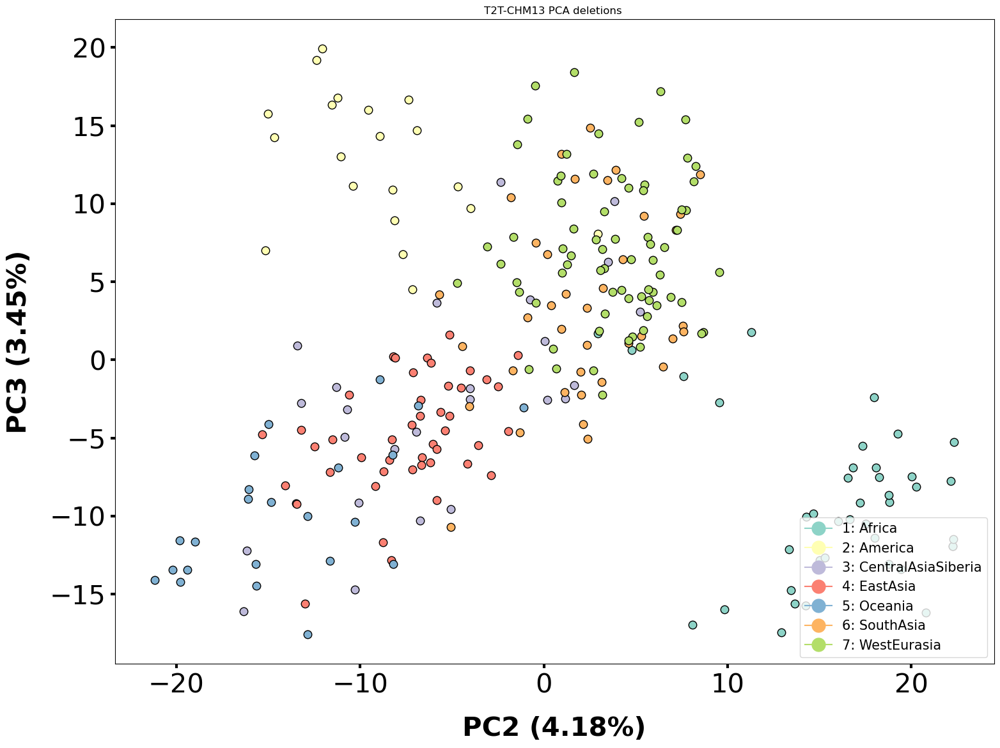

In [104]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (4.18%)', label_vertical='PC3 (3.45%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc23.png', transparent=True)

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -7.168682    -1.433392    13.813166     3.621006     9.636043   
Oceania       -11.469066   -15.643315   -14.469856     1.506634    10.380743   
America        -8.515121   -10.389580    11.135262    -6.415615     1.930925   
WestEurasia    -5.948108     5.643517     7.865438     4.053170    -5.181580   
WestEurasia    -9.525563     7.251044     8.313841     2.954047    -3.407788   
...                  ...          ...          ...          ...          ...   
WestEurasia    22.428002     6.909994     4.037074     6.745860     5.583452   
Africa         -9.984591     8.093783   -16.951945   -10.898939     8.505338   
Oceania        -0.470107   -12.851146   -17.589435     5.556594    13.981656   
Oceania        -1.695346   -19.412616   -13.433295     8.611276    14.919345   
Africa          2.758191    16.811247   

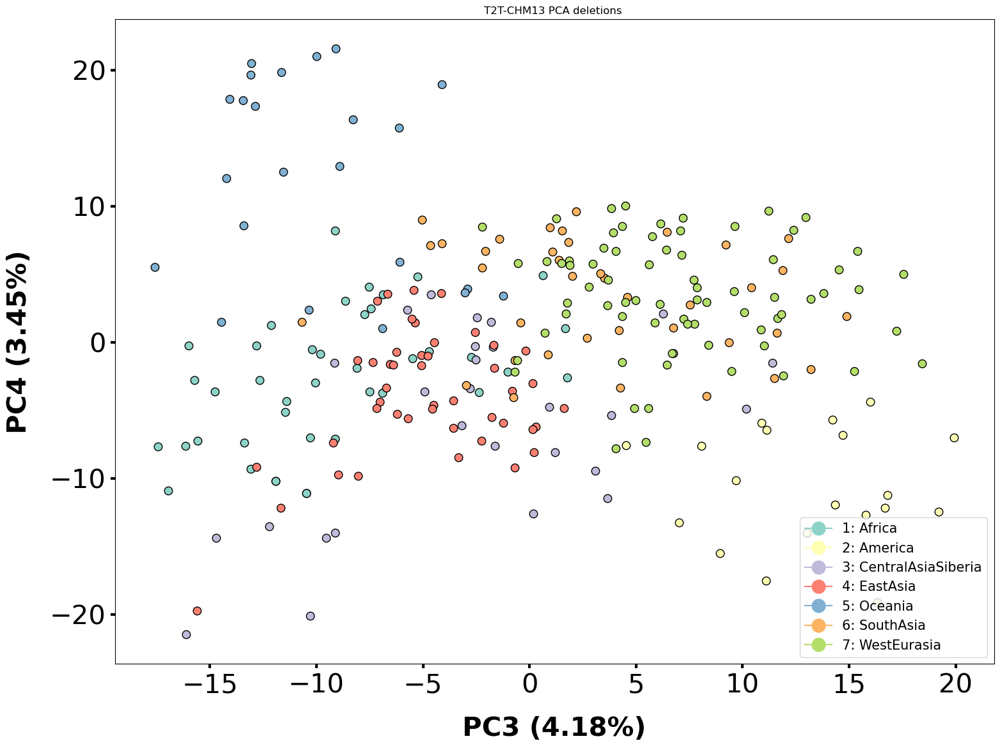

In [105]:
plot_scatter_cluster(data=df_pca, abscissa='component_3', ordinate='component_4', label_horizontal='PC3 (4.18%)', label_vertical='PC4 (3.45%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc34.png', transparent=True)

<h1> Duplications

In [157]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,84,85,494,504,3506,4224,4601,5419,7422,7964,...,1108995,1109003,1109011,1109013,1109029,1109049,1110846,1112110,1113136,1114476
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,3,2,3,3,3,3,2,3,3,4,...,4,3,3,4,4,3,2,3,2,3
LP6005441-DNA_A03,2,2,3,2,3,3,3,3,3,3,...,2,2,2,3,3,3,2,4,3,3
LP6005441-DNA_A04,3,2,3,3,3,3,2,4,3,4,...,3,3,3,3,3,3,2,4,2,2
LP6005441-DNA_A05,3,2,3,2,3,3,3,3,3,3,...,4,4,3,4,4,3,2,4,2,3
LP6005441-DNA_A06,3,2,3,3,3,3,3,4,3,4,...,4,3,3,4,4,3,3,4,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6007069-DNA_A01,3,2,2,2,3,3,3,3,3,3,...,3,3,2,3,4,3,4,4,2,2
SS6004471,3,2,3,3,3,3,2,4,3,3,...,3,3,2,3,4,3,2,3,2,2
SS6004477,3,2,3,3,3,2,2,3,3,3,...,2,2,2,3,3,2,3,3,2,2


In [158]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.10664303, 0.03178502, 0.02317643, 0.0216515 , 0.01644226,
       0.0143703 , 0.01304898, 0.01214906, 0.01142528, 0.01076258])

             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -4.108555     0.842818    -4.202573     1.229771    -3.267533   
Oceania        -8.384493    18.644096     7.036604     1.253032     4.900457   
America        -7.988800    -4.153313    10.580571    16.712184    -3.114429   
WestEurasia    -4.556960    -2.301025    -5.798114     2.716048    -3.913617   
WestEurasia   -12.462996     1.360649    -4.653229     0.948292    -1.727336   
...                  ...          ...          ...          ...          ...   
WestEurasia     7.840652     4.101689    -0.923367     4.579822     3.308078   
Africa         -9.275660    -0.317758    -1.474613    -5.138351     2.532213   
Oceania        -7.121792     8.346676     2.269345    -9.334524     2.578931   
Oceania        -2.401834    10.286546     4.124262     1.225500     1.167472   
Africa          2.521284     1.561208   

Count of groups by factor: 7
             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -4.108555     0.842818    -4.202573     1.229771    -3.267533   
Oceania        -8.384493    18.644096     7.036604     1.253032     4.900457   
America        -7.988800    -4.153313    10.580571    16.712184    -3.114429   
WestEurasia    -4.556960    -2.301025    -5.798114     2.716048    -3.913617   
WestEurasia   -12.462996     1.360649    -4.653229     0.948292    -1.727336   
...                  ...          ...          ...          ...          ...   
WestEurasia     7.840652     4.101689    -0.923367     4.579822     3.308078   
Africa         -9.275660    -0.317758    -1.474613    -5.138351     2.532213   
Oceania        -7.121792     8.346676     2.269345    -9.334524     2.578931   
Oceania        -2.401834    10.286546     4.124262     1.225500     1.167472   
Africa     

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


             component_1  component_2  component_3  component_4  component_5  \
Region                                                                         
WestEurasia    -4.108555     0.842818    -4.202573     1.229771    -3.267533   
Oceania        -8.384493    18.644096     7.036604     1.253032     4.900457   
America        -7.988800    -4.153313    10.580571    16.712184    -3.114429   
WestEurasia    -4.556960    -2.301025    -5.798114     2.716048    -3.913617   
WestEurasia   -12.462996     1.360649    -4.653229     0.948292    -1.727336   
...                  ...          ...          ...          ...          ...   
WestEurasia     7.840652     4.101689    -0.923367     4.579822     3.308078   
Africa         -9.275660    -0.317758    -1.474613    -5.138351     2.532213   
Oceania        -7.121792     8.346676     2.269345    -9.334524     2.578931   
Oceania        -2.401834    10.286546     4.124262     1.225500     1.167472   
Africa          2.521284     1.561208   

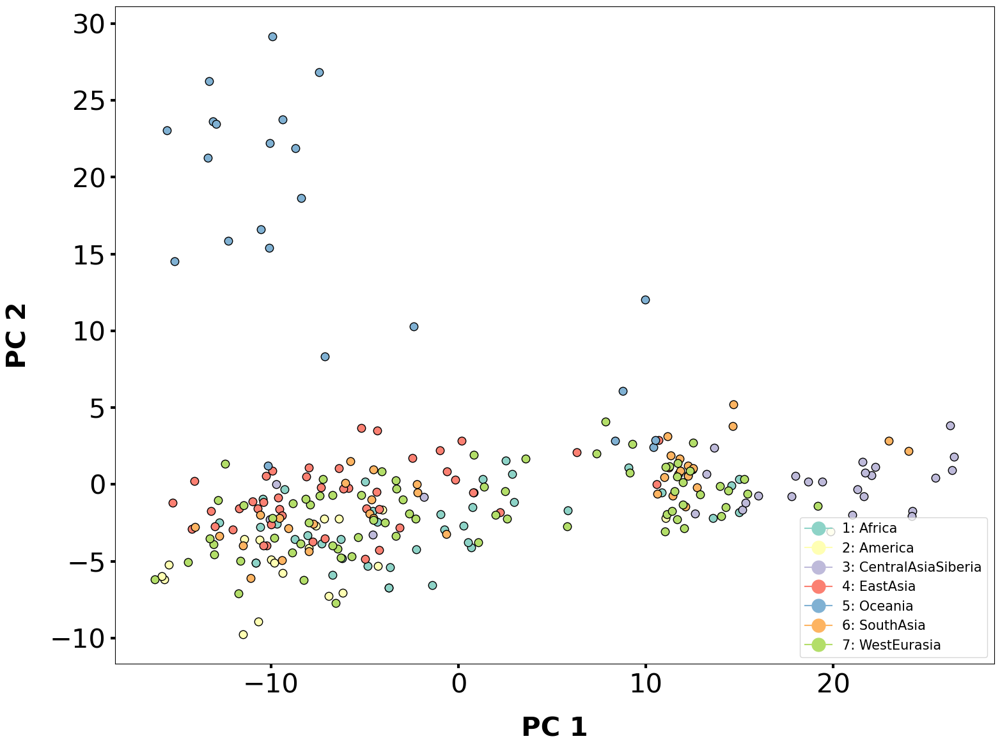

In [ ]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.19%)', label_vertical='PC2 (5.10%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc12.png', transparent=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (5.10%)', label_vertical='PC3 (2.30%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

plt.savefig('../plots/t2t_chm13_pca_duplications_pc23.png', transparent=True)

In [ ]:
vst_dt_filtered_duplications = vst_dt.iloc[cnv_passed_vst.index]
vst_dt_filtered_duplications.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)

<h1> Permutation

In [ ]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


In [ ]:
cnvs_passed_vst.columns

In [ ]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

In [ ]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

In [ ]:
pd.DataFrame(p_value_permutation)

In [ ]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_chm13.csv')
permutation_pased__vst_chm13

In [ ]:
permutation_pased__vst_chm13  = pd.read_csv('../data/permutation_passed_vst_chm13.csv', index_col=0)
permutation_pased__vst_chm13 = permutation_pased__vst_chm13.fillna(0)

<h1> Just vst values that passed permutation

In [ ]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end', 'index'])
vst_dt_sb.describe()

In [ ]:
passed_permut = (permutation_pased__vst_chm13 <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

In [ ]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [ ]:
passed_permut

In [ ]:
#sns.set_palette("bright")
for i in passed_permut.columns:
    plt.hist(passed_permut[i], bins=100, alpha=0.2,log=True, color="blue")
    plt.title('T2T-CHM13')

In [ ]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

<h1> Gene regions

In [ ]:
gene_coordinates_ranges = PyRanges(gene_coordinates)
gene_coordinates_ranges

In [ ]:
final_cnv_ranges = PyRanges(final_cnv)
final_cnv_df = final_cnv_ranges.overlap(gene_coordinates_ranges, invert=False)
final_cnv_df = final_cnv_df.as_df()
#final_cnv_df = final_cnv_df[final_cnv_df['Chromosome'] =='8'] #487805
final_cnv_df.to_csv('../data/T2TCHM13_cnvs_genes.csv.zip', compression="zip")

In [ ]:
final_cnv_df

In [ ]:
#final_cnv = final_cnv.iloc[new]
final = final_cnv_df.iloc[:,3:284]
counts = final

counts = counts.fillna(2)
counts = counts[counts.lt(5).all(axis=1)]

counts = counts.T
counts = counts.sort_index()
counts

In [ ]:
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()

In [ ]:
#PCA

pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

In [ ]:
pca.explained_variance_ratio_

In [ ]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))
#    plot_scatter_cluster(data=df_pca, abscissa='component_8', ordinate='component_9', label_horizontal='Component 1', label_vertical='Component 3', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    
    

In [ ]:
<h1> Testing permutation 